음악 구조 섹션 사이의 전환을 표시할 수 있는 노벨티(novelty) 기반 분할을 소개하며, 노벨티를 감지하는 방법을 알아본다.

> 이 글은 [FMP(Fundamentals of Music Processing) Notebooks](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html)을 참고로 합니다.

In [27]:
import numpy as np
import librosa
from scipy import signal
from scipy import ndimage
from matplotlib import pyplot as plt
import matplotlib
import matplotlib.gridspec as gridspec
import IPython.display as ipd
import pandas as pd

from utils.structure_tools import read_structure_annotation, compute_tempo_rel_set, \
compute_sm_from_filename, convert_structure_annotation, plot_feature_ssm, generate_ssm_from_annotation
from utils.plot_tools import plot_signal, plot_segments_overlay, plot_matrix

주요 참고자료: Jonathan Foote: <strong>Automatic audio segmentation using a measure of audio novelty.</strong> Proceedings of the IEEE International Conference on Multimedia and Expo (ICME), New York, NY, USA, 2000, pp. 452&ndash;455.

# 노벨티 분할 (Novelty Segmentation)

- 음악의 세그먼트 경계는 종종 악기 편성, 다이나믹, 하모니, 템포 또는 기타 특성의 변화를 수반한다. 새로움/노벨티(novelty) 기반 구조 분석의 목적은 이러한 음악적 변화가 발생하는 시점을 찾아 두 개의 연결된 구조 부분 사이의 전환을 표시하는 것이다. 

- 이 포스트는 SSM(self-similarity matrices)의 구조적 속성을 기반으로 하는 고전적인 경계 탐지(boundary detection) 절차에 대해 설명한다.

- 기본 특징 시퀀스가 전체 섹션 기간 동안 어느 정도 일정하게 유지되는 경우, SSM은 **블록-like 구조(block-like structure)** 를 나타낸다. 종종 그러한 동종(homogeneous) 세그먼트 뒤에는 이전 세그먼트와 대조되는 또 다른 동종 세그먼트가 뒤따른다. 예를 들어, 현악기로 연주되는 부분 다음에 금관악기로 연주되는 부분이 나올 수 있다. 또는 두 개의 **대조 섹션(contrasting sections)** 이 있을 수 있으며 각각 하모니와 관련하여 동질적이며 이러한 섹션 간의 경계는 음악 키(key)의 변화로 특징지어진다. 대조적인 동종 섹션(contrasting homogeneous section)은 SSM의 로컬 **바둑판 모양 블록 구조(checkerborad-like block structure)** 에 의해 반영된다.

- 예를 들어 Johannes Brahms의 헝가리 무곡 5번 Ormandy 녹음을 보면 $\mathrm{G}$ 마이너에 동종 $A$ 부분 세그먼트가 있고 $\mathrm{G}$ 메이저에 동종 $C$ 부분 세그먼트가 있다.
- SSM은 특징 스무딩 기법(features smoothing techniques)과 함께 크로마 기반 특징(chroma-based features)을 사용하여 얻는다.

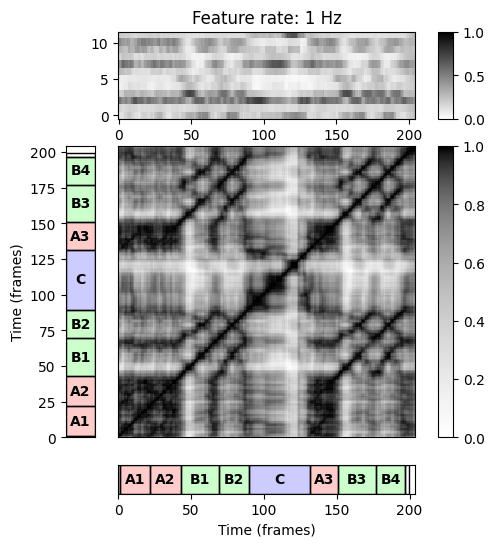

In [2]:
# Annotation

fn_ann = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.csv'
ann, color_ann = read_structure_annotation(fn_ann)

# SM
fn_wav = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.wav'
tempo_rel_set = compute_tempo_rel_set(0.66, 1.5, 5)
x, x_duration, X, Fs_X, S, I = compute_sm_from_filename(fn_wav, 
                                                L=81, H=10, L_smooth=1, thresh=1)

# Visualization
ann_frames = convert_structure_annotation(ann, Fs=Fs_X) 
fig, ax = plot_feature_ssm(X, 1, S, 1, ann_frames, x_duration*Fs_X,
            label='Time (frames)', color_ann=color_ann, clim_X=[0,1], clim=[0,1], 
            title='Feature rate: %0.0f Hz'%(Fs_X))

ipd.Audio(fn_wav)

**전체적인 과정**

- Foote (2000)의 절차의 아이디어는 SSM의 주 대각선을 따라 작은 바둑판 모양(체커보드)의 커널을 연결시켜 로컬 변화를 측정하는 것이다.
- 이로 인해 커널이 두 개의 대조되는 블록 사이의 전환을 만나는 시간 위치에서 피크를 나타내는 **노벨티 함수**(**novelty function**)가 생성된다.
- 새로움 기반 분할(segmentation) 알고리즘의 전체 파이프라인은 다음과 같이 요약할 수 있다.
     * 오디오 녹음을 일련의 오디오 특징으로 변환한다.
     * 블록-like 구조를 강화하면서 SSM을 계산한다.
     * 체커보드 커널을 대각선으로 이동하여 노벨티 함수를 계산한다.
     * 노벨티 함수의 피크(오디오 녹음의 변경 사항에 해당)를 찾는다.

## 체커보드 커널 (Checkerboard Kernel): 박스(Box)

- $X=(x_1,x_2,\ldots x_N)$을 특징 시퀀스라고 하고 $\mathbf{S}$를 $X$에서 파생된 $N\times N$ 크기의 SSM이라고 하자. 
- 먼저 두 개의 동질적이지만 대조되는 섹션으로 구성된 오디오 녹음을 고려해 보기로 한다. 시각화하면 SSM 결과는 $2\times 2$ 체커보드처럼 보인다.

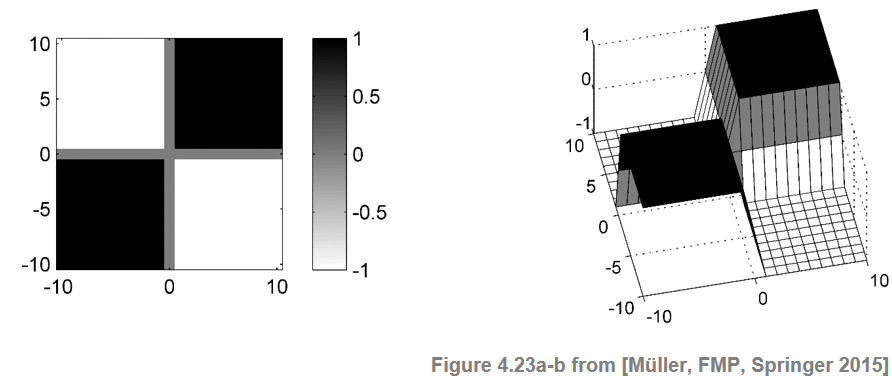

In [3]:
ipd.Image('../img/5.music_structure_analysis/FMP_C4_F23a-b.png', width= 500)

- 주대각선에 있는 두 개의 어두운 블록은 두 섹션 내에서 유사도가 높은 영역에 해당한다. 대조적으로, 이 블록 외부의 밝은 영역은 섹션 간의 낮은 교차 유사성이 있음을 나타낸다. 따라서 두 부분의 경계를 찾기 위해서는 바둑판의 크럭스를 식별해야 한다.
- 이는 $\mathbf{S}$를 체커보드처럼 보이는 커널과 연관시켜 수행할 수 있다. 가장 간단한 커널은 다음과 같이 정의된 $(2\times 2)$ 단위 커널이다.

$$\mathbf{K} = \left[\begin{array}{rr} -1 & 1\\ 1 & -1 \end{array}\right]
        = \left[\begin{array}{rr} 0 & \,\,\,\,\,1\\ 1 & 0 \end{array}\right] -
          \left[\begin{array}{rr} 1 & \,\,\,\,\,0\\ 0 & 1 \end{array}\right]$$

- 이 커널은 "coherence" 커널과 "anti-coherence" 커널의 차이로 쓸 수 있다.
- 첫 번째 커널은 중심점 양쪽의 자기 유사성(self-similarity)을 측정하며 두 영역이 각각 동질일 때 높을 것이다.
- 두 번째 커널은 두 영역 간의 교차 유사성(cross-similarity)을 측정하며 중심점에서 차이가 거의 없을 때 높을 것이다.
- 두 값의 차이는 중심점에서 특징 시퀀스의 **새로움/노벨티(novelty)** 을 추정한다. 두 영역이 자기-유사하지만 서로 다를 때 노벨티가 높다.

- 일반적으로 더 큰 시간 척도의 변화에 관심이 있는 오디오 구조 분석에서는 더 큰 크기의 커널이 사용된다.
- 물리적 시간 위치가 윈도우 또는 커널의 중심과 연관되는 중심 보기(centered view)를 채택하면, 어떤 $L\in\mathbb{N}$에 대해 $M=2L+1$로 주어진 커널의 크기가 홀수라고 가정한다.
- $M$ 크기의 **상자 모양(box-like)의 체커보드 커널**은 $[-L:L]\times[-L:L]$로 인덱싱되는 $(M\times M)$ 행렬 $\mathbf{K}_\mathrm{Box}$이다.
- 행렬은 다음과 같이 정의된다.
$$\mathbf{K}_\mathrm{Box} = \mathrm{sgn}(k)\cdot \mathrm{sgn}(\ell),$$
$k,\ell\in[-L:L]$, "$\mathrm{sgn}$"는 부호 함수($-1$는 음수, $0$는 0, $1$는 양수) 


- 예를 들어, $L=2$인 경우 다음과 같다.
$$\mathbf{K}_\mathrm{Box} = \left[\begin{array}{rrrrr} 
-1 & -1 & \,\,\,\,\,0 & 1 & 1 \\ 
-1 & -1 & 0 &1 & 1 \\
 0 &  0  & 0 & 0 &0 \\
 1 & 1  & 0 & -1 & -1 \\
 1 & 1  & 0 & -1 & -1       
 \end{array}\right]$$

- 커널 행렬의 대칭성을 확보하기 위해 이론적인 이유로 중간에 0 행과 0 열을 더 많이 도입한다.

- 다음 코드 셀에서는 상자 모양의 바둑판 커널을 구현하고 시각화한다.

In [1]:
def compute_kernel_checkerboard_box(L):
    """Compute box-like checkerboard kernel [FMP, Section 4.4.1]

    Args:
        L (int): Parameter specifying the kernel size 2*L+1

    Returns:
        kernel (np.ndarray): Kernel matrix of size (2*L+1) x (2*L+1)
    """
    axis = np.arange(-L, L+1)
    kernel = np.outer(np.sign(axis), np.sign(axis))
    return kernel

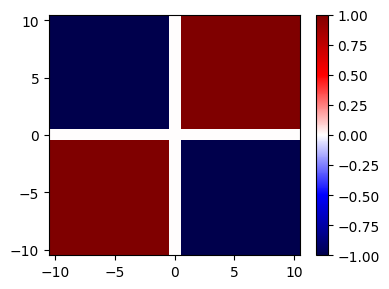

In [5]:
L = 10
kernel = compute_kernel_checkerboard_box(L)
plt.figure(figsize=(4,3))
plt.imshow(kernel, aspect='auto', origin='lower', 
           extent=[-L-0.5,L+0.5,-L-0.5,L+0.5], cmap='seismic')
plt.colorbar()
plt.tight_layout()

## 체커보드 커널: 가우시안 (Gaussian) 

- 가장자리 효과(edge effect)를 피하기 위해 가장자리에서 0을 향해 점점 가늘어지는 윈도우를 사용하여 바둑판 커널을 부드럽게 할 수 있다.
- 이를 위해 다음과 같이 정의된 방사형(radially) 대칭 **가우시안(Gaussian) 함수** $\phi:\mathbb{R}^2\to \mathbb{R}$를 사용할 수 있다.
$$\phi(s,t) = \mathrm{exp}(-\varepsilon^2(s^2+t^2)),$$
이때 $\varepsilon>0$ 매개변수를 사용하면 테이퍼링 정도를 조정할 수 있다.

- 그런 다음 행렬 $\mathbf{K}_\mathrm{Gauss}$에 의해 주어진 **가우시안 체커보드 커널**은 pointwise 곱셈으로 얻는다.
$$\mathbf{K}_\mathrm{Gauss}(k,\ell) = \phi(k,\ell) \cdot \mathbf{K}_\mathrm{Box}(k,\ell),$$
for $k,\ell\in[-L:L]$

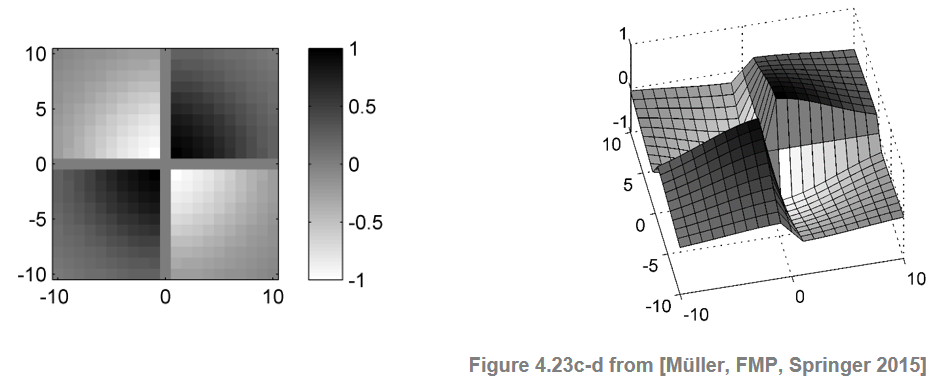

In [6]:
ipd.Image('../img/5.music_structure_analysis/FMP_C4_F23c-d.png',width=500)

- 실제 커널 크기와 테이퍼링의 영향을 보상하기 위해 커널을 정규화할 수 있다.
- 커널을 커널 행렬의 절대값 합계로 나누어 할 수 있다.
$$\mathbf{K}_\mathrm{norm}(k,\ell) = \frac{\mathbf{K}_\mathrm{Gauss}(k,\ell)}{\sum_{k,\ell\in[-L:L]}|\mathbf{K}_\mathrm{Gauss}(k,\ell)|}$$

- 서로 다른 크기의 커널에서 얻은 노벨티 정보를 결합하고 융합할 때 정규화가 중요해진다.

- 다음 구현에서 테이퍼 매개변수 $\varepsilon$은 분산 $\sigma$(커널 크기 $M=2L+1$에 대해 정규화됨)로 지정된다.

In [9]:
def compute_kernel_checkerboard_gaussian(L, var=1, normalize=True):
    """Compute Guassian-like checkerboard kernel [FMP, Section 4.4.1].
    See also: https://scipython.com/blog/visualizing-the-bivariate-gaussian-distribution/

    Args:
        L (int): Parameter specifying the kernel size M=2*L+1
        var (float): Variance parameter determing the tapering (epsilon) (Default value = 1.0)
        normalize (bool): Normalize kernel (Default value = True)

    Returns:
        kernel (np.ndarray): Kernel matrix of size M x M
    """
    taper = np.sqrt(1/2) / (L * var)
    axis = np.arange(-L, L+1)
    gaussian1D = np.exp(-taper**2 * (axis**2))
    gaussian2D = np.outer(gaussian1D, gaussian1D)
    kernel_box = np.outer(np.sign(axis), np.sign(axis))
    kernel = kernel_box * gaussian2D
    if normalize:
        kernel = kernel / np.sum(np.abs(kernel))
    return kernel

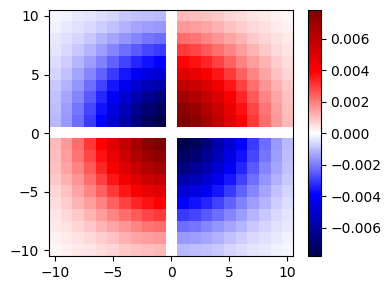

In [10]:
L = 10
var = 0.5
kernel = compute_kernel_checkerboard_gaussian(L, var)
plt.figure(figsize=(4,3))
plt.imshow(kernel, aspect='auto', origin='lower', 
           extent=[-L-0.5,L+0.5,-L-0.5,L+0.5], cmap='seismic')
plt.colorbar()
plt.tight_layout()

## 노벨티 함수

- 인접한 블록 사이의 2D 코너 포인트를 감지하기 위해 SSM을 바둑판 커널과 로컬에서 비교할 수 있다.
- 이를 위해 SSM의 주 대각선을 따라 적절한 체커보드 커널 $\mathbf{K}$를 슬라이드하고 $\mathbf{K}$와 $\mathbf{S}$의 요소별 곱을 합산한다.
$$\Delta_\mathrm{Kernel}(n) := \sum_{k,\ell\in[-L:L]} \mathbf{K}(k,\ell) \mathbf{S}(n+k,n+\ell)$$
for $n\in[L+1:N-L]$

- **제로-패딩**으로 경계에서 행렬 $\mathbf{S}$을 확장하면(즉, $(k,\ell)\in\mathbb{Z}\times\mathbb{Z} \setminus [1:N]\times[1:N]$에 대해 $\mathbf{S}(k,\ell)=0$ 설정), $n\in[1:N]$로 가정할 수 있다.
- 이는 $\Delta_\mathrm{Kernel}:[1:N]\to\mathbb{R}$ 함수를 정의하며, **노벨티 함수**라고도 하며, 이는 특징 시퀀스의 각 인덱스 $n\in[1:N]$에 대해 새로움의 척도 $\Delta_\mathrm{Kernel}(n)$를 구체화한다.

- $\mathbf{K}$ 커널이 $\mathbf{S}$의 비교적 균일한(uniform) 영역에 위치할 때 그 곱의 양수 값과 음수 값의 합은 0이 되고 $\Delta_\mathrm{Kernel}( n)$이 작아진다.
- 반대로 $\mathbf{K}$ 커널이 $\mathbf{S}$의 체커보드와 같은 구조의 꼭지점에 정확히 위치하면 곱의 값은 모두 양수이고 합계는 큰 $\Delta_\mathrm{Kernel}( n)$이 된다.

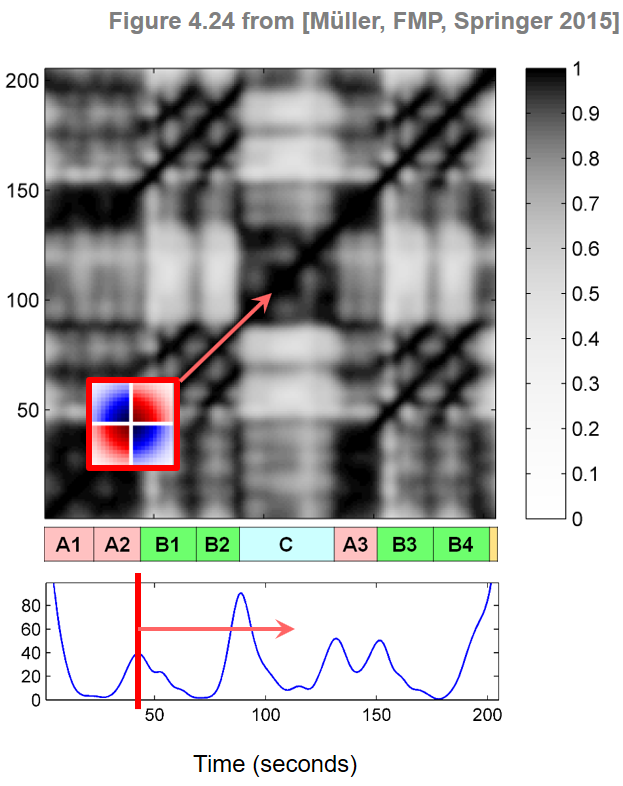

In [11]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F24_color.png", width=400)

In [2]:
def compute_novelty_ssm(S, kernel=None, L=10, var=0.5, exclude=False):
    """Compute novelty function from SSM [FMP, Section 4.4.1]

    Args:
        S (np.ndarray): SSM
        kernel (np.ndarray): Checkerboard kernel (if kernel==None, it will be computed) (Default value = None)
        L (int): Parameter specifying the kernel size M=2*L+1 (Default value = 10)
        var (float): Variance parameter determing the tapering (epsilon) (Default value = 0.5)
        exclude (bool): Sets the first L and last L values of novelty function to zero (Default value = False)

    Returns:
        nov (np.ndarray): Novelty function
    """
    if kernel is None:
        kernel = compute_kernel_checkerboard_gaussian(L=L, var=var)
    N = S.shape[0]
    M = 2*L + 1
    nov = np.zeros(N)
    # np.pad does not work with numba/jit
    S_padded = np.pad(S, L, mode='constant')

    for n in range(N):
        # Does not work with numba/jit
        nov[n] = np.sum(S_padded[n:n+M, n:n+M] * kernel)
    if exclude:
        right = np.min([L, N])
        left = np.max([0, N-L])
        nov[0:right] = 0
        nov[left:N] = 0

    return nov

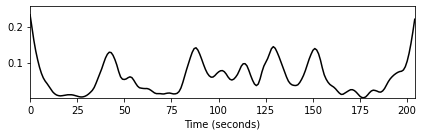

In [13]:
L_kernel = 20
nov = compute_novelty_ssm(S, L=L_kernel, exclude=False)   
fig, ax, line = plot_signal(nov, Fs = Fs_X, color='k')    

- 위는 Brahms 예의 크로마 기반 SSM에 대해 노벨티 곡선을 계산했다.
- 우선, 노벨티 함수는 시작과 끝에서 큰 값을 가진다는 것을 알 수 있다. SSM의 **제로 패딩**으로 인한 이 아티팩트(부산물)는 첫 번째와 마지막 $L$ 프레임에 대해 노벨티 곡선 $\Delta_\mathrm{Kernel}$을 0으로 설정하여 억제할 수 있다.

- 다음 그림은 세그먼트 주석(annotation)으로 오버레이된 결과 노벨티 곡선을 보여준다. 그림에서 알 수 있듯이, 노벨티 함수의 local maxima는 하모니의 변화를 잘 나타내고 있으며, 특히 서로 다른 음악적 부분에 해당하는 세그먼트 간의 경계에서 발생한다.

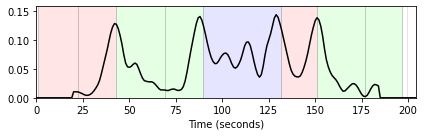

In [14]:
L_kernel = 20
nov = compute_novelty_ssm(S, L=L_kernel, exclude=True)        
fig, ax, line = plot_signal(nov, Fs = Fs_X, color='k') 
plot_segments_overlay(ann, ax=ax, colors=color_ann, alpha=0.1, edgecolor='k', print_labels=False)
plt.tight_layout()

## 커널 크기 (Kernel Size)

- 시작하는 SSM의 quality 외에도 커널의 크기는 노벨티 함수의 속성에 중요한 영향을 미친다.
- **작은 커널**은 짧은 시간 척도에서 새로움을 감지하는 데 적합할 수 있는 반면, **큰 커널**은 거친 구조 섹션 간의 경계 및 전환을 감지하는 데 적합하다.
- 주어진 커널의 적합성은 각 응용과 기본이 되는 SSM의 속성에 따라 크게 달라진다.

- 다음 예는 다른 특징 표현(다른 특징 속도 포함)을 기반으로 다른 크기와 SSM을 사용하는 노벨티 함수를 보여준다. 작은 커널 크기를 사용하면 거짓 피크와 함께 노이즈가 많은 노벨티 함수가 발생할 수 있다. 이것은 기본 SSM이 블록뿐만 아니라 경로와 같은 구조를 포함할 때 특히 그렇다.
- 더 큰 커널을 사용하면 로컬 변동을 평균화하고 더 부드러운 노벨티 함수가 생성된다.
- SSM 스무딩(smoothing)으로 유사한 효과를 얻을 수 있으며, 이는 종종 블록 구조의 향상과 경로 구조의 감쇠로 이어진다.

- SSM 속성과 커널 크기 사이의 상호 작용은 다음 그림에 설명되어 있다.

<img src="../img/5.music_structure_analysis/FMP_C4_F25_text.png" width="600px" alt="FMP_C4_F25_text">

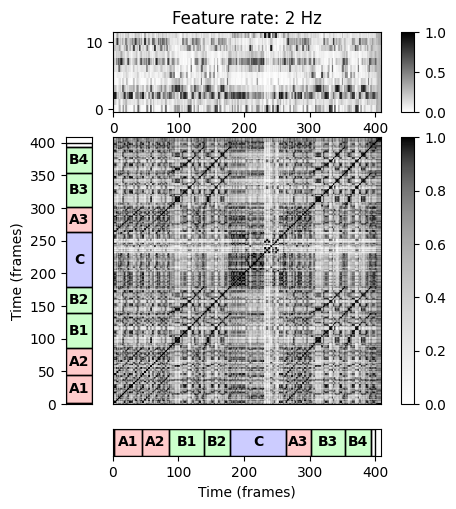

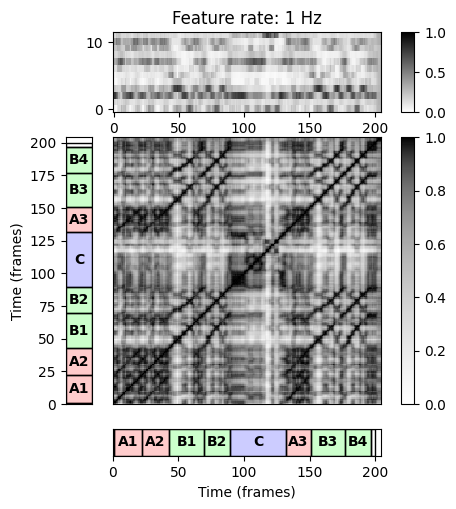

In [15]:
S_dict = {}
Fs_dict = {}
x, x_duration, X, Fs_X, S, I = compute_sm_from_filename(fn_wav, 
                                                L=11, H=5, L_smooth=1, thresh=1)
S_dict[0], Fs_dict[0] = S, Fs_X
ann_frames = convert_structure_annotation(ann, Fs=Fs_X) 
fig, ax = plot_feature_ssm(X, 1, S, 1, ann_frames, x_duration*Fs_X,
            label='Time (frames)', color_ann=color_ann, clim_X=[0,1], clim=[0,1], 
            title='Feature rate: %0.0f Hz'%(Fs_X), figsize=(4.5, 5.5))


x, x_duration, X, Fs_X, S, I = compute_sm_from_filename(fn_wav, 
                                                L=41, H=10, L_smooth=1, thresh=1)
S_dict[1], Fs_dict[1] = S, Fs_X
ann_frames = convert_structure_annotation(ann, Fs=Fs_X) 
fig, ax = plot_feature_ssm(X, 1, S, 1, ann_frames, x_duration*Fs_X,
            label='Time (frames)', color_ann=color_ann, clim_X=[0,1], clim=[0,1], 
            title='Feature rate: %0.0f Hz'%(Fs_X), figsize=(4.5, 5.5))

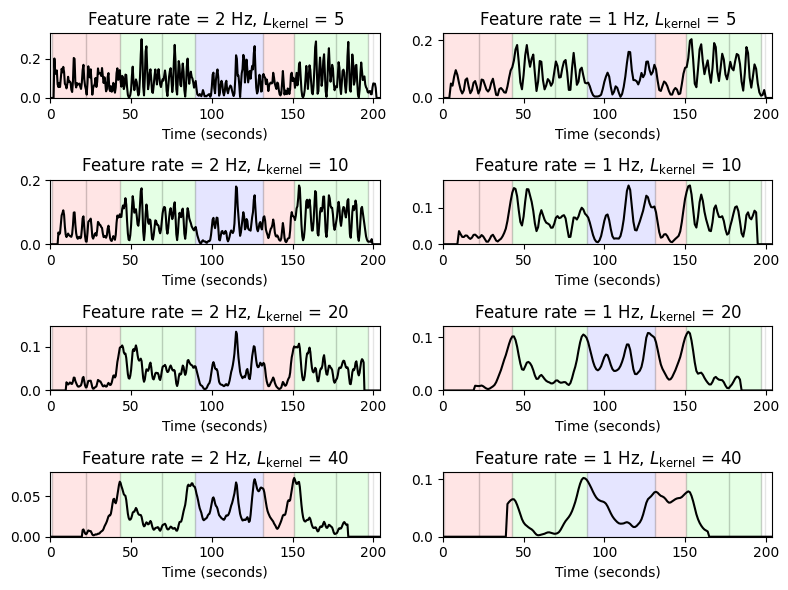

In [16]:
figsize=(8,6)
L_kernel_set = [5, 10, 20, 40]
num_kernel = len(L_kernel_set)
num_SSM = len(S_dict)

fig, ax = plt.subplots(num_kernel, num_SSM, figsize=figsize)
for s in range(num_SSM):
    for t in range(num_kernel):
        L_kernel = L_kernel_set[t]
        S = S_dict[s]
        nov = compute_novelty_ssm(S, L=L_kernel, exclude=True)        
        fig_nov, ax_nov, line_nov = plot_signal(nov, Fs = Fs_dict[s], 
                color='k', ax=ax[t,s], figsize=figsize, 
                title='Feature rate = %0.0f Hz, $L_\mathrm{kernel}$ = %d'%(Fs_dict[s],L_kernel)) 
        plot_segments_overlay(ann, ax=ax_nov, colors=color_ann, alpha=0.1, 
                                       edgecolor='k', print_labels=False)
plt.tight_layout()
plt.show()  

- 종종 해당 값이 노벨티 함수의 로컬 평균을 초과할 때만 피크가 선택되는 적응적(adaptive) 임계값 전략이 적용되기도 한다. 

- 거짓 피크의 수를 더 줄이기 위한 또 다른 전략으로 두 개의 후속 피크 위치 사이의 최소 거리에 제약을 가하는 방법도 있다.

# 구조 특징 (Structure Feature)

- 노벨티 감지(novelty detection)를 위한 대부분의 방법은 주어진 음악 신호의 지역적(local) 특성을 포착하는 특징을 기반으로 수행된다.
- 예를 들어 MFCC 기반 또는 크로마 기반 기능은 각각 음색 또는 화음과 관련된 로컬 특성을 캡처한다. 그런 다음 이러한 특징 표현을 기반으로 지역적 커널(local kernel) 또는 미분 연산자 유형을 적용하여 참신성의 척도를 계산한다.
- **국지화된(localized) 특징**을 기반으로 국지적 차이를 계산하면 다소 임의적인 잡음과 같은 변동에 취약해진다.

- 이제 화음이나 음색과 같은 국지적 음악적 측면을 넘어서는 **전역적(global) 구조적 속성**을 통합하는 노벨티 감지 절차를 설명한다.
- 이를 위해 다양한 구조 분석 원리를 하나의 통합 프레임워크로 통합할 수 있는 기반이 되는 **구조 특징**(**structure features**)을 도입한다. 구조 특징의 기본 아이디어는 주어진 특징 시퀀스의 각 프레임에 대해 동일한 특징 시퀀스의 다른 모든 프레임과의 관계를 측정하여 지역 및 전연적 측면을 공동으로 고려하는 것이다. 이는 특징 시퀀스의 **전역적** 구조적 특성을 캡처하는 **지역적** 기능 표현과 같은 프레임 방식을 생성한다.
- 구조 특징의 결과는 표준 노벨티 감지 절차와 함께 사용할 수 있다.

## 시차(Time-lag) 표현

- 구조 특징을 정의하기 위한 주요 기술 요소인 **시차 행렬(time-lag matrix)** 의 개념을 소개한다.

- $\mathbf{S}$를 특징 시퀀스 $X=(x_1,x_2,\ldots,x_N)$에서 파생된 자기 유사성 행렬(SSM)이라고 하자.

- $\alpha_1=[s_1:t_1]$ 및 $\alpha_2=[s_2:t_2]$와 같은 두 개의 반복 세그먼트는 $(s_1,s_2)$에서 시작하여 $(t_1,t_2)$에서 끝나는 $\mathbf{S}$의 높은 유사성 경로이다. 또한 두 세그먼트 사이에 상대적인 템포 차이가 없으면 경로는 기본 대각선과 정확히 평행하다.

- $\ell=s_2-s_1$ 프레임에 해당하는 **시차**가 지나면 $\alpha_1$ 세그먼트가 반복된다는 것으로 이 속성을 표현할 수도 있다. 이것은 하나의 시간(time) 축이 지연(lag) 축으로 대체되는 SSM의 시차 표현이라는 개념으로 이어진다.
- 표기를 단순화하기 위해 다음에서 프레임이 인덱스 $n=0$부터 시작하여 인덱싱된다고 가정한다. 따라서 $X=(x_0,x_1,\ldots,x_{N-1})$와 자기 유사성 행렬 $\mathbf{S}$는 $[0:N-1]\times[0 :N-1]$으로 인덱싱된다.

- $\mathbf{S}$의 **시차 표현**은 다음과 같이 정의된다.
$$\mathrm{L}(\ell,n)=\mathbf{S}(n+\ell,n)$$
for $n\in[0:N-1]$ and $\ell\in[-n:N-1-n]$

- 시차 매개변수 $\ell$의 범위는 시간 매개변수 $n$에 따라 달라진다. $n+\ell$ 합계가 $[0:N-1]$ 범위에 있도록 시차 지수를 선택해야 한다. 예를 들어 시간 인덱스 $n=0$의 경우 $\ell\in[0:N-1]$로만 미래를 볼 수 있지만 시간 인덱스 $n=N-1$의 경우 $\ell\in[-N+1:0]$로 과거만을 볼 수 있다.

- 표기법을 단순화하기 위해 정의를 통해 **순환(circular) 시차 표현** $\mathrm{L}^{\!\circ}$을 도입한다.
$$\mathrm{L}^{\!\circ}(\ell,n)=\mathbf{S}\big( (n+\ell) \mod N, n \big)$$
for $n\in[0:N-1]$ and $\ell\in[0:N-1]$

### 구현과 예제

- 이제 음악 형식 $A_1B_1A_2B_2B_3A_3$에 해당하는 종합적으로 생성된 SSM을 고려하여 정의를 설명해보자

- 다음 그림은 입력 SSM $\mathbf{S}$, 시차 표현 결과 $\mathrm{L}$ 및 순환 버전 $\mathrm{L}^{\!\circ}$를 보여준다.
- $\mathrm{L}$ 표현은 원본 행렬 $\mathbf{S}$를 가로축에 평행하게 잘라 얻는다. 
- 결과적으로 $\mathbf{S}$에서 주대각선과 평행한 선은 $\mathrm{L}$에서 수평선이 된다. 즉, 대각선 구조가 수평 구조로 변형된다.
- 순환 버전에서 $\mathrm{L}$에서 사용되는 음의 시차 매개변수 $\ell\in[-n:-1]$는 $\mathrm{L}^{\!\circ}$에서 $\ell+N$로 식별된다.
- 이렇게 하면 시차 표현 $\mathrm{L}^{\!\circ}$는 다시 $[0:N-1]\times[0:N-1]$로 인덱싱된 행렬이 되며, 행렬 $\mathbf{S}$에 대해서도 그렇다.

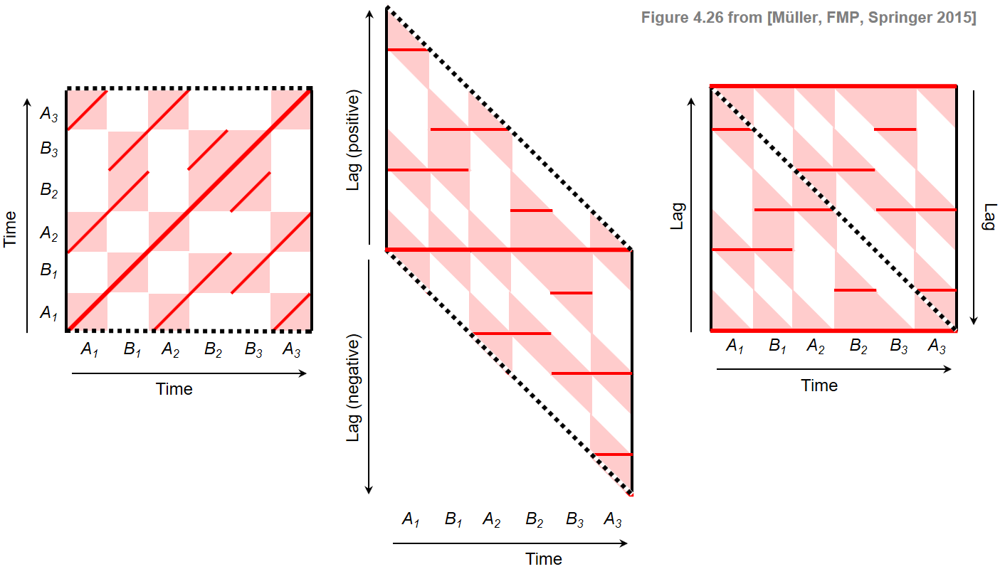

In [17]:
ipd.Image('../img/5.music_structure_analysis/FMP_C4_F26.png', width=600)

In [18]:
def compute_time_lag_representation(S, circular=True):
    """Computation of (circular) time-lag representation

    Args:
        S (np.ndarray): Self-similarity matrix
        circular (bool): Computes circular version (Default value = True)

    Returns:
        L (np.ndarray): (Circular) time-lag representation of S
    """
    N = S.shape[0]
    if circular:
        L = np.zeros((N, N))
        for n in range(N):
            L[:, n] = np.roll(S[:, n], -n)
    else:
        L = np.zeros((2*N-1, N))
        for n in range(N):
            L[((N-1)-n):((2*N)-1-n), n] = S[:, n]
    return L

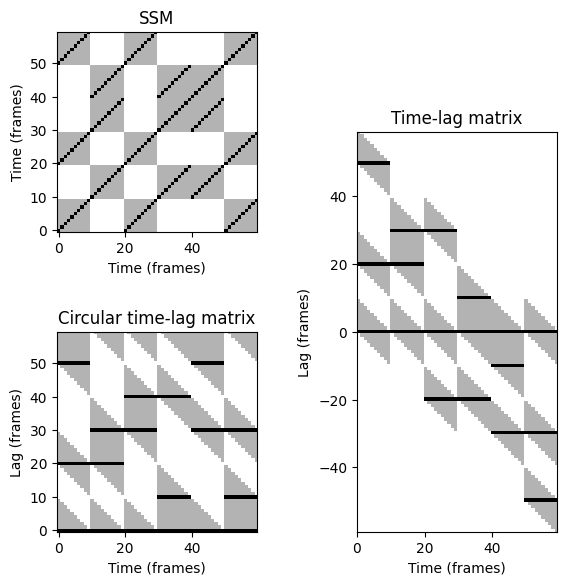

In [19]:
ann = [[0, 9, 'A'], [10, 19, 'B'], [20, 29, 'A'], [30, 39, 'B'], [40, 49, 'B'], [50, 59, 'A']]
S = generate_ssm_from_annotation(ann, score_path=1, score_block=0.3)
N = S.shape[0]
L = compute_time_lag_representation(S, circular=False)
L_circ = compute_time_lag_representation(S, circular=True)

plt.figure(figsize=(5, 5))

ax1 = plt.axes([0, 0.6, 0.4, 0.4]) 
ax2 = plt.axes([0, 0, 0.4, 0.4])
ax3 = plt.axes([0.6, 0.0, 0.4, 0.8]) 

fig, ax, im = plot_matrix(S, ax=[ax1], title='SSM', 
                                   xlabel='Time (frames)', ylabel='Time (frames)', colorbar=None)

fig, ax, im = plot_matrix(L_circ, ax=[ax2], title='Circular time-lag matrix', 
                                   xlabel='Time (frames)', ylabel='Lag (frames)', colorbar=None)

fig, ax, im = plot_matrix(L, ax=[ax3], extent=[0, N-1, -(N-1), N-1], title='Time-lag matrix', 
                                   xlabel='Time (frames)', ylabel='Lag (frames)', colorbar=None)

- $A$ 파트가 $B_1$ 파트 세그먼트의 길이와 같고 $B_2$ 파트 세그먼트의 길이가 두 배($B_1$의 템포의 절반으로 연주됨)인 $AB_1B_2$ 구조의 음악 작품을 보자.
- 주 대각선과 **평행하지 않은** $\mathbf{S}$에서의 경로 구조는 결과 원형 시차 표현 $\mathrm{L}^{\!\circ}$에서 해석하기 어려워진다.

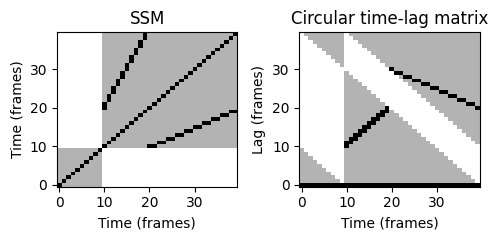

In [21]:
ann = [[0, 9, 'A'], [10, 19, 'B'], [20, 39, 'B']]
S = generate_ssm_from_annotation(ann, score_path=1, score_block=0.3)
N = S.shape[0]
L = compute_time_lag_representation(S, circular=False)
L_circ = compute_time_lag_representation(S, circular=True)

plt.figure(figsize=(5, 2.5))
ax = plt.subplot(121)
fig, ax, im = plot_matrix(S, ax=[ax], title='SSM', 
                                   xlabel='Time (frames)', ylabel='Time (frames)', colorbar=None)
ax = plt.subplot(122)
fig, ax, im = plot_matrix(L_circ, ax=[ax], title='Circular time-lag matrix', 
                                   xlabel='Time (frames)', ylabel='Lag (frames)', colorbar=None)
plt.tight_layout()

## 구조 특징과 노벨티 함수

- 다음에서 $\mathbf{S}^{[n]}$는 주어진 시간 프레임 $n\in[0:N-1]$에 대해 $\mathbf{S}$의 $n^{\mathrm{th}}$ 열을 나타낸다.

- $\mathbf{S}^{[n]}\in\mathbb{R}^N$ 벡터는 $n$ 시간 프레임에 존재하는 관계의 종류를 나타낸다. $\mathbf{S}^{[n]}(m)$ (for $m\in[0:N-1]$)가 큰 경우, $n$ 시간 프레임은 $m$ 시간 프레임과 관련된다. 값이 작은 경우, 두 프레임은 관련이 없다. 
- 즉, $\mathbf{S}^{[n]}$는 프레임 $n$의 전역적인 구조 관계를 드러낸다.

- 시차 행렬 ${\mathrm{L}^{\!\circ}}^{[n]}$의 $n^{\mathrm{th}}$ 열에 대해서도 동일한 해석이 적용된다.

- 그러나 $\mathbf{S}$와 $\mathrm{L}^{\!\circ}$ 사이에는 결정적인 차이가 있다. 연속되는 두 프레임 $n$과 $n+1$이 동일한 구조적 속성을 갖는 경우, 두 벡터 $\mathbf{S}^{[n]}$와 $\mathbf{S}^{[n+ 1]}$는 서로 **순환 이동(cyclically shifted)** 버전인 반면, 두 벡터 ${\mathrm{L}^{\!\circ}}^{[n]}$ 및 ${\mathrm{L} ^{\!\circ}}^{[n+1]}$는 **동일(identical)** 하다.

- 이 관찰을 기반으로 **구조 특징(structure feature)** 을 $y_n:={\mathrm{L}^{\!\circ}}^{[n]}\in\mathbb{R}^N$ for $\mathrm{L}^{\!\circ}$, $n\in[0:N-1]$ 열로 정의한다.
- 이 과정을 통해 지역적(음향, 음악적) 특성을 포착한 $x_n$의 원래 시퀀스 $X=(x_0,x_1,\ldots,x_{N-1})$를 전역(구조) 특성을 캡처하는 피처 $y_n$의 시퀀스 $Y=(y_0,y_1,\ldots,y_{N-1})$로 변환했다. 결과적으로 전역 구조 부분의 경계는 특징 시퀀스 $Y$의 지역적 변화를 찾아 식별할 수 있다.

- 이러한 지역적 변화를 포착하는 방법에는 여러 가지가 있다. 간단한 전략은 적절한 거리 함수를 기반으로 연속 구조 특징 간의 차이를 계산하는 것이다. 예를 들어 $\mathbb{R}^N$의 유클리드 norm을 사용하면 **노벨티 함수**를 얻는다.
$$\Delta_\mathrm{Structure}(n) := \| y_{n+1}-y_n \|= \|{\mathrm{L}^{\!\circ}}^{[n+1]}-{\mathrm{L}^{\!\circ}}^{[n]}\|$$
for $n\in[0:N-2]$.

- 다시 제로 패딩으로 $n\in[0:N-1]$를 가정할 수 있다. 이 함수의 로컬 최대값 또는 피크의 위치는 구조적 경계에 대한 후보를 선정한다.

- 전체 절차는 원래 시퀀스 $X$에 사용된 특징 유형 또는 $\mathbf{S}$가 계산되는 방식을 포함하여 많은 설계 선택 및 매개변수 설정에 따라 달라진다.

- 또한 실제로는 더 많은 관련 도함수 연산자를 사용하고 적절한 전처리 단계(예: 행렬 $\mathrm{L}^{\!\circ}$ 추가 향상) 및 후처리 단계(예: novelty 함수 $\Delta_\mathrm{Structure}$ 정규화)를 적용하는 경우가 많다.

- 마지막으로 피크 선택 전략은 최종 결과에 결정적인 영향을 미칠 수 있다.

### 구현과 예제

- 다음 코드 셀에서는 구조 특징을 기반으로 novelty 함수를 계산한다. 위에서 소개한 합성 예제 $A_1B_1A_2B_2B_3A_3$에 대한 결과를 표시한다.
- 이 예에서 생성되는 novelty 함수의 피크 위치는 경로 구성 요소의 (조인트) 시작 및 끝 위치와 일치하며, 이는 차례로 음악 섹션의 경계와 일치한다.

In [22]:
def novelty_structure_feature(L, padding=True):
    """Computation of the novelty function from a circular time-lag representation

    Args:
        L (np.ndarray): Circular time-lag representation
        padding (bool): Padding the result with the value zero (Default value = True)

    Returns:
        nov (np.ndarray): Novelty function
    """
    N = L.shape[0]
    if padding:
        nov = np.zeros(N)
    else:
        nov = np.zeros(N-1)
    for n in range(N-1):
        nov[n] = np.linalg.norm(L[:, n+1] - L[:, n])
    return nov


def plot_ssm_structure_feature_nov(S, L, nov, Fs=1, figsize=(10, 3), ann=[], color_ann=[]):
    """Plotting an SSM, structure features, and a novelty function

    Args:
        S: SSM
        L: Circular time-lag representation
        nov: Novelty function
        Fs: Feature rate (indicated in title of SSM) (Default value = 1)
        figsize: Figure size (Default value = (10, 3))
        ann: Annotations (Default value = [])
        color_ann: Colors used for annotations (see :func:`libfmp.b.b_plot.plot_segments`) (Default value = [])

    Returns:
        ax1: First subplot
        ax2: Second subplot
        ax3: Third subplot
    """
    plt.figure(figsize=figsize)
    ax1 = plt.subplot(131)
    if Fs == 1:
        title = 'SSM'
    else:
        title = 'SSM (Fs = %d)' % Fs
    fig_im, ax_im, im = plot_matrix(S, ax=[ax1], title=title,
                                             xlabel='Time (frames)', ylabel='Time (frames)')
    if ann:
        plot_segments_overlay(ann, ax=ax_im[0], edgecolor='k',
                                       print_labels=False, colors=color_ann, alpha=0.05)

    ax2 = plt.subplot(132)
    fig_im, ax_im, im = plot_matrix(L, ax=[ax2], title='Structure features',
                                             xlabel='Time (frames)', ylabel='Lag (frames)', colorbar=True)
    if ann:
        plot_segments_overlay(ann, ax=ax_im[0], edgecolor='k', ylim=False,
                                       print_labels=False, colors=color_ann, alpha=0.05)

    ax3 = plt.subplot(133)
    fig, ax, im = plot_signal(nov, ax=ax3, title='Novelty function',
                                       xlabel='Time (frames)', color='k')
    if ann:
        plot_segments_overlay(ann, ax=ax, edgecolor='k', colors=color_ann, alpha=0.05)
    plt.tight_layout()
    return ax1, ax2, ax3

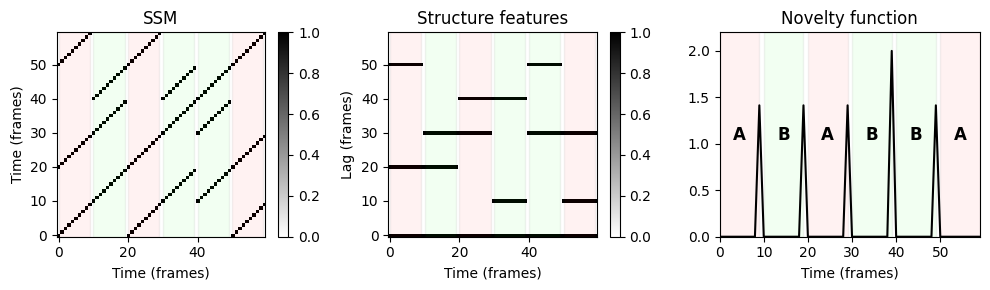

In [23]:
color_ann = {'A': [1, 0, 0, 0.2], 'B': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0.2]}
ann = [[0, 9, 'A'], [10, 19, 'B'], [20, 29, 'A'], [30, 39, 'B'], [40, 49, 'B'], [50, 59, 'A']]
S = generate_ssm_from_annotation(ann, score_path=1, score_block=0)
L = compute_time_lag_representation(S, circular=True)
nov = novelty_structure_feature(L)
ax = plot_ssm_structure_feature_nov(S, L, nov, ann=ann, color_ann=color_ann)

- 구조 특징은 두 가지 이유로 이 예에서 특히 잘 작동한다.
    - 첫째, 반복되는 부분이 많아 경로 구조가 풍부하다.
    - 둘째, 두 개의 반복되는 음악 부분이 서로 다른 순으로 발생하여, 구조 특징에 잘 포착되는 특성적인 경로 단절이 발생한다.
- 즉, $A_1A_2A_3A_4$ 또는 $A_1B_1A_2B_2$의 음악적 구조를 가진 작품에서는 구조 기반 참신성 감지가 작동하지 않지만 $A_1B_1A_2A_3$ 또는 $A_1A_2B_1B_2$의 음악적 구조를 가진 작품에서는 잘 작동한다.


- 다음 그림으로 그 사실을 볼 수 있다.

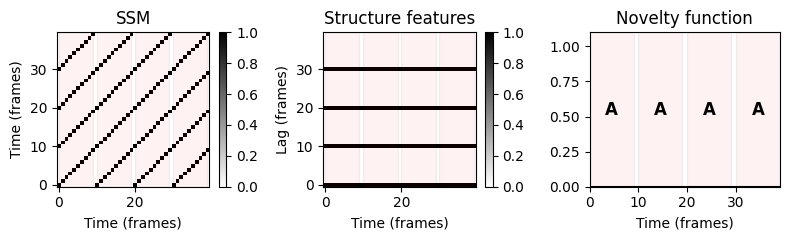

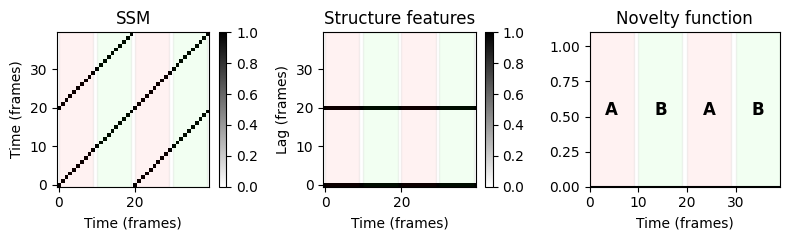

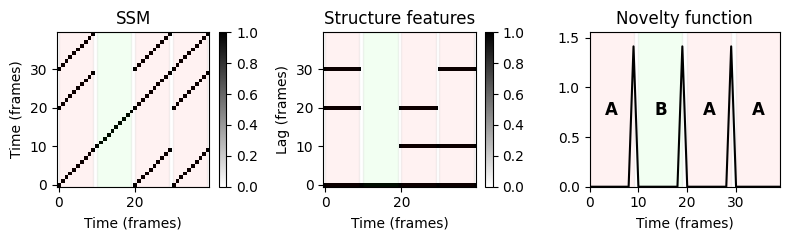

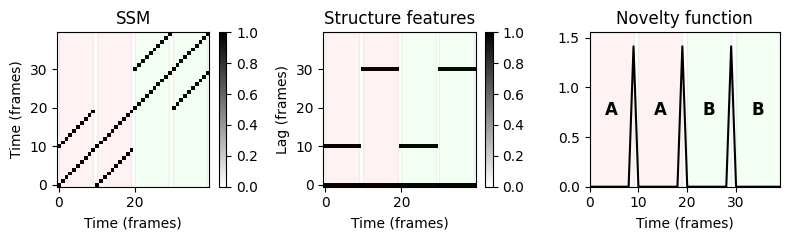

In [24]:
color_ann = {'A': [1, 0, 0, 0.2], 'B': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0.2]}
figsize = (8,2.5)

ann_set = [[[0, 9, 'A'], [10, 19, 'A'], [20, 29, 'A'], [30, 39, 'A']],
       [[0, 9, 'A'], [10, 19, 'B'], [20, 29, 'A'], [30, 39, 'B']],
       [[0, 9, 'A'], [10, 19, 'B'], [20, 29, 'A'], [30, 39, 'A']],
       [[0, 9, 'A'], [10, 19, 'A'], [20, 29, 'B'], [30, 39, 'B']]]

for ann in ann_set:
    S = generate_ssm_from_annotation(ann, score_path=1, score_block=0)
    L = compute_time_lag_representation(S, circular=True)
    nov = novelty_structure_feature(L)
    ax = plot_ssm_structure_feature_nov(S, L, nov, figsize=figsize, ann=ann, color_ann=color_ann)

# 전체과정 예시

## Example: Chopin

- 구조-기반 노벨티 감지(novelty detection)의 전체적인 과정을 설명하기 위해 쇼팽의 Prelude Op.28, No. 11 (구조 $A_1A_2BA_3A_4CD$)를 보자. 

- 다음 그림은 크로마-기반의 특징 표현으로부터 계산된 (경로-향상과 임계값-설정된) SSM이다.

- 또한, 그림은 시차(time-lag) 행렬 $\mathrm{L}^{\!\circ}$과 참신성 함수 $\Delta_\mathrm{Structure}$를 보여준다. 

- 녹음과 세그먼트가 짧기 때문에, 상대적으로 높은 피쳐 레이트를 사용한다.

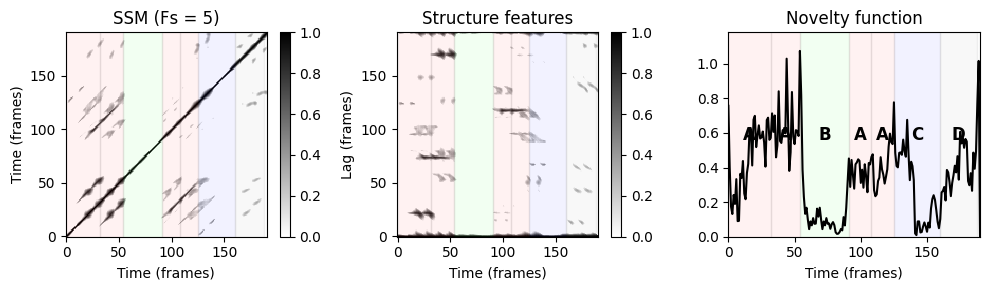

In [25]:
fn_wav = '../data_FMP/FMP_C4_Audio_Chopin_Op028-11_003_20100611-SMD.wav'
fn_ann = '../data_FMP/FMP_C4_Audio_Chopin_Op028-11_003_20100611-SMD.csv'
x, x_duration, X, Fs_feature, S, I = compute_sm_from_filename(fn_wav, L=9, H=2, L_smooth=11, thresh= 0.1)

ann_frames, color_ann = read_structure_annotation(fn_ann, Fs=Fs_feature, remove_digits=True, index=True)
color_ann = {'A': [1, 0, 0, 0.2], 'B': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0.2]}

L = compute_time_lag_representation(S, circular=True)
nov = novelty_structure_feature(L)
ax = plot_ssm_structure_feature_nov(S, L, nov, Fs=Fs_feature, ann=ann_frames, color_ann=color_ann)

- 하지만 노벨티 곡선이 상당히 노이즈해 보인다. 세그먼트 경계 중 일부(예: $A_2$에서 $B$ 또는 $A_4$에서 $C$)만 피크 위치로 잘 표시된다.

- 최종 결과에 상당한 영향을 미칠 수 있는 많은 매개 변수(예: 특징 표현 또는 시간적 해상도)가 있다.

- 이 예에서 $\mathrm{L}^{\!\circ}$로 정의된 구조 특징은 잡음이 많고, 최종 참신성 함수를 손상시키는 많은 작은 조각을 포함하고 있다. 
- 이러한 이상값을 제거하고 노이즈를 억제하는 좋은 방법은 가로 방향으로 **중앙값 필터**를 적용하는 것이다. 또한, 참신함 계산의 미분을 작은 편차에 덜 취약하게 만들기 위해 **가우시안 커널**과 함께 **컨볼루션(convolution)** 을 적용하여 시차 행렬을 더 매끄럽게 할 수 있다.
- 이 두 가지 후처리 전략의 효과는 다음 그림에 설명되어 있다.

Application of median filter


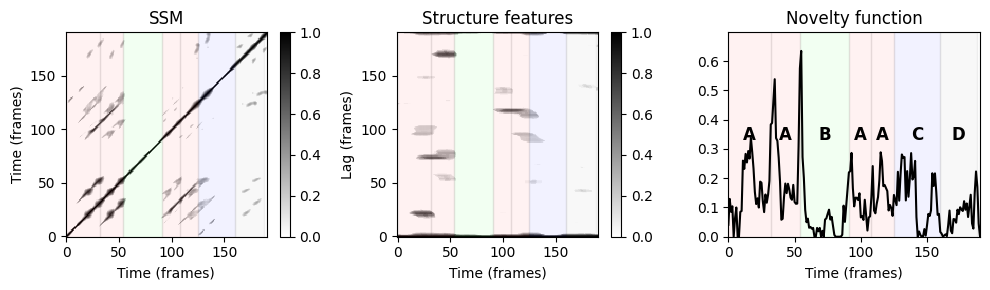

Application of convolution filter


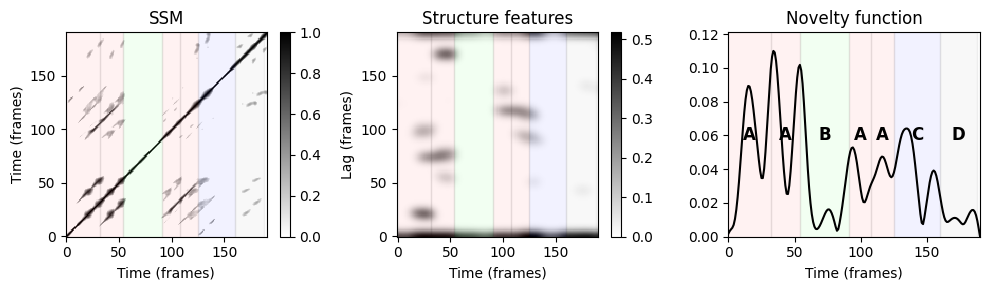

In [28]:
print('Application of median filter')
L_filter = ndimage.median_filter(L, (3,11))
nov = novelty_structure_feature(L_filter)
ax = plot_ssm_structure_feature_nov(S, L_filter, nov, ann=ann_frames, color_ann=color_ann)
plt.show()

print('Application of convolution filter')
L_filter = ndimage.gaussian_filter(L_filter, 4)
nov = novelty_structure_feature(L_filter)
ax = plot_ssm_structure_feature_nov(S, L_filter, nov, ann=ann_frames, color_ann=color_ann)

## Example:  Brahms 

- 다음으로 브람스의 헝가리 무곡 예($A_1A_2B_1B_2CA_3B_3B_4D$)도 적용해보자.

- B파트 세그먼트 사이의 상대적 템포 차이 때문에, 시차 표현을 쓰는 것에 문제가 생기는 것을 볼 수 있다.

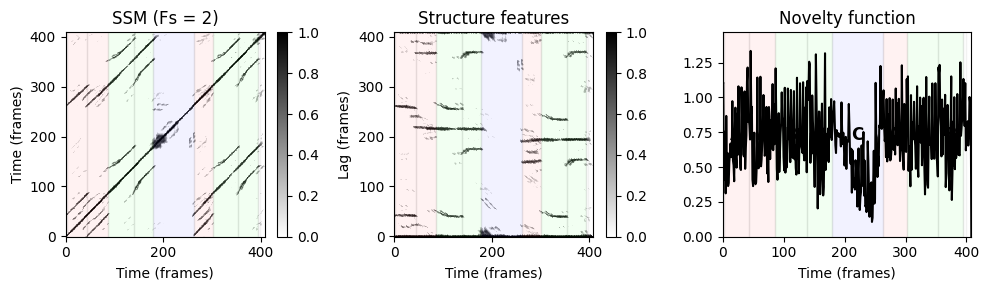

In [30]:
fn_wav = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.wav'
fn_ann = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.csv'

tempo_rel_set = np.array([0.8, 1, 1.25])
x, x_duration, X, Fs_feature, S, I = compute_sm_from_filename(fn_wav, L=21, H=5, 
                                    L_smooth=11, tempo_rel_set=tempo_rel_set, thresh= 0.1)

ann_frames, color_ann = read_structure_annotation(fn_ann, Fs=Fs_feature, remove_digits=True, index=True)

L = compute_time_lag_representation(S, circular=True)
nov = novelty_structure_feature(L)
ax = plot_ssm_structure_feature_nov(S, L, nov, Fs=Fs_feature, ann=ann_frames, color_ann=color_ann)

- 노벨티 함수의 문제는 입력 SSM에서 이미 볼 수 있는 잡음이 많은 경로 관계 때문이며, 또한 상대적인 템포 차이로 인한 비대각선 경로 구조 때문이기도 하다.

- 다시 말하지만, 노벨티 함수를 계산하기 전에 일부 후처리(중앙값 필터링, 가우시안 커널과의 컨볼루션)를 적용하면 일부 문제가 완화된다.

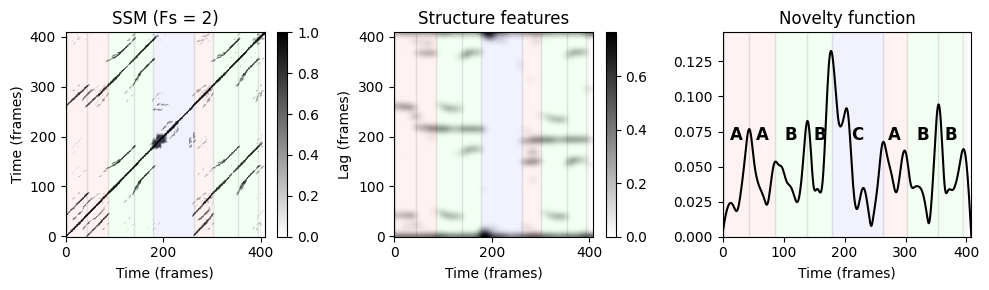

In [31]:
L_filter = ndimage.median_filter(L, (3,21))
L_filter = ndimage.gaussian_filter(L_filter, 6)
nov = novelty_structure_feature(L_filter)
ax = plot_ssm_structure_feature_nov(S, L_filter, nov, Fs=Fs_feature, ann=ann_frames, color_ann=color_ann)

- 입력된 SSM의 품질은 의미 있는 노벨티를 얻기 위해 매우 중요하다. 스무딩 기술(중앙값, 컨볼루션)을 적용하여 시차 행렬을 후처리하는 것은 전체 절차의 견고성을 높이는 중요한 단계이다.

- 음악적으로 정보를 얻은 방식(예: 세그먼트의 예상 최소 길이, 음악 녹음 기간)으로 절차의 매개변수(예: 기능 해상도, SSM 매개변수, SSM 임계값, 필터 매개변수)를 조정하면 최종 결과를 크게 향상시킬 수 있다.

---

출처: 

- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C4/C4S4_NoveltySegmentation.html

- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C4/C4S4_StructureFeature.html

---

[구글 Colab 링크](https://colab.research.google.com/github/jo-cho/mir_kr/blob/main/Notebooks/5.%20Music%20Structure%20Analysis/5.3.Audio_Thumbnail.ipynb)